In [149]:
import geopandas as gpd
import numpy as np

In [150]:
shp_directory = 'perm'
shp_filename = 'perm_centre1.shp'

In [151]:
gdf = gpd.read_file('shapefiles/'+shp_directory+'/'+shp_filename)

In [300]:
gdf.head(5)

,full_id,osm_id,osm_type,highway,bicycle,service,junction,lanes_bus,lines,constructi,...,lanes_forw,lanes_bus_,maxspeed,turn_lan_2,trolley_wi,name,lanes,surface,oneway,geometry
0,w23909921,23909921,way,primary_link,None,None,None,None,None,None,...,None,None,None,None,None,None,None,asphalt,yes,"LINESTRING (56.25250 57.99639, 56.25263 57.996..."
1,w23909922,23909922,way,primary,None,None,None,None,None,None,...,None,None,None,left|left|through|through,yes,Комсомольская площадь,4,asphalt,yes,"LINESTRING (56.25216 57.99559, 56.25216 57.995..."
2,w23909926,23909926,way,secondary,None,None,None,None,None,None,...,None,None,RU:urban,None,None,улица Луначарского,3,asphalt,yes,"LINESTRING (56.20752 58.00309, 56.20784 58.002..."
3,w23909927,23909927,way,primary,None,None,None,None,None,None,...,2,1,None,None,None,Екатерининская улица,3,asphalt,None,"LINESTRING (56.26372 58.01575, 56.26358 58.015..."
4,w23909929,23909929,way,primary,None,None,None,None,None,None,...,None,None,RU:urban,None,None,Комсомольский проспект,3,asphalt,yes,"LINESTRING (56.23445 58.01559, 56.23452 58.015..."


In [155]:
from math import radians, sin, cos, asin, sqrt
def haversine(lon1, lat1, lon2, lat2):
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat / 2) ** 2 + cos(lat1) * cos(lat2) * sin(dlon / 2) ** 2
    return 2 * 6371 * asin(sqrt(a))

In [157]:
from shapely.geometry import Point, LineString

# Пермь
ctov = dict()
etols = dict()
v = []
e = []

for i, linestring in enumerate(gdf['geometry']):
    x, y = linestring.coords.xy
    
    if i%1000 == 0:
        print(i)
    
    prev = None
    
    for x, y in zip(x, y):
        
        
        if (x,y) not in ctov:
            ctov[(x, y)] = len(v)
            v.append((x, y))
            
        if prev == None:
            prev = (x,y)
            
            continue
            
            
        road_length=haversine(prev[0], prev[1], x, y)
        e.append((ctov[prev], ctov[(x, y)], road_length))
        
        
        etols[(e[-1][0], e[-1][1])] = LineString([Point(prev[0], prev[1]), Point(x, y)])
        etols[(e[-1][1], e[-1][0])] = LineString([Point(prev[0], prev[1]), Point(x, y)])
        
        prev = (x,y)
    
    
    
   # print(f"added edge from {ctov[st]} to {ctov[en]}")
        

0
1000
2000
3000
4000
5000
6000
7000
8000


In [158]:
len(v), len(e), len(etols)

(33774, 36903, 73806)

In [225]:
def nearest_vertex_to_landmark(landmark):
    mn = 10000000000000000
    mni = -1
    for i, vertex in enumerate(v):
        if haversine(landmark[0], landmark[1], vertex[0], vertex[1]) < mn:
            mni = i
            mn = haversine(landmark[0], landmark[1], vertex[0], vertex[1])
    return mni

In [347]:
landmarks=[(56.302686,58.017599), (56.1883540,57.9792318), (56.1989042,58.0355922)]

In [348]:
for l in landmarks:
    print(nearest_vertex_to_landmark(l))

7908
8661
2584


In [366]:
from shapely.geometry import Point
st = 1234
end = 16666
p_st = Point(v[st][0], v[st][1])
p_end = Point(v[end][0], v[end][1])

In [367]:


with open('graphs/input.txt', 'w') as f:
    f.write(f'{len(v)} {len(e)} {st} {end}\n')
    for edge in e:
        f.write(f'{edge[0]} {edge[1]} {edge[2]}\n')
    for vertex in v:
        f.write(f'{vertex[0]} {vertex[1]}\n')

In [351]:
ans = []
checked = []
with open('graphs/output_dijkstra.txt', 'r') as f:
    ans_size = f.readline()
    for i in range(int(ans_size)-1):
        edge = tuple(map(int, f.readline().split()))
        ans.append(edge)
    checked_size = f.readline()
    for i in range(int(checked_size)-1):
        edge = tuple(map(int, f.readline().split()))
        checked.append(edge)


In [352]:
crs = {'init':'epsg:4326'}

geometry_shortest_path = [etols[xy] for xy in ans]
gdf_shortest_path = gpd.GeoDataFrame(geometry = geometry_shortest_path)
geometry_checked = [etols[xy] for xy in checked]
gdf_checked = gpd.GeoDataFrame(geometry = geometry_checked)
gdf_st = gpd.GeoDataFrame(geometry = [p_st])
gdf_end = gpd.GeoDataFrame(geometry = [p_end])

In [353]:
len(geometry_shortest_path), len(geometry_checked)

(118, 65673)

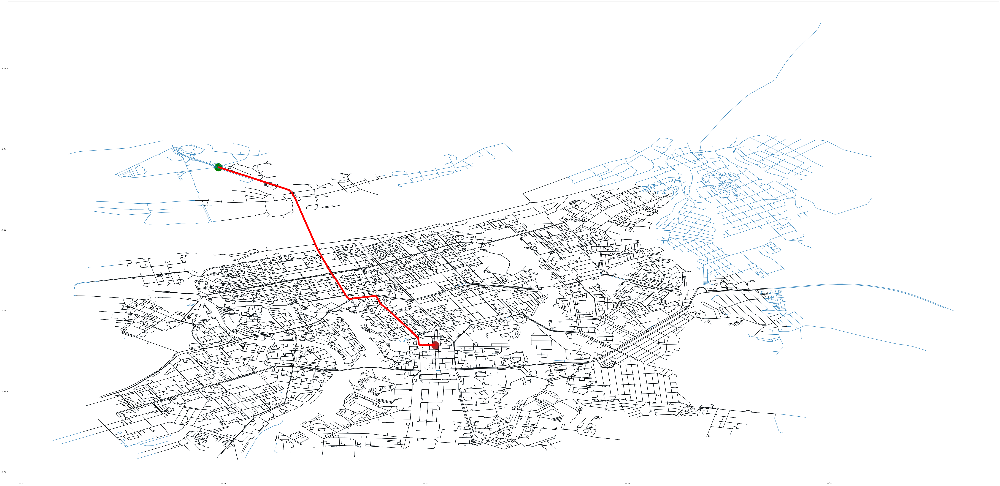

In [354]:
base = gdf.plot(figsize=(100,100))
checked = gdf_checked.plot(ax=base, color='black')
fig = gdf_shortest_path.plot(ax = checked, color='red', linewidth=10)
fig = gdf_st.plot(ax = fig, color='brown', markersize=2000)
fig = gdf_end.plot(ax = fig, color='green', markersize=2000)
fig.plot();

In [355]:
fig.get_figure().savefig('res_img/dijkstra/'+shp_directory+'.png')

In [356]:
ans = []
checked = []
with open('graphs/output_biderectional_dijkstra.txt', 'r') as f:
    ans_size = f.readline()
    for i in range(int(ans_size)-1):
        edge = tuple(map(int, f.readline().split()))
        ans.append(edge)
    checked_size = f.readline()
    for i in range(int(checked_size)-1):
        edge = tuple(map(int, f.readline().split()))
        checked.append(edge)


In [357]:
crs = {'init':'epsg:4326'}

geometry_shortest_path = [etols[xy] for xy in ans]
gdf_shortest_path = gpd.GeoDataFrame(geometry = geometry_shortest_path)

geometry_checked = [etols[xy] for xy in checked]
gdf_checked = gpd.GeoDataFrame(geometry = geometry_checked)

In [358]:
len(geometry_shortest_path), len(geometry_checked)

(118, 30094)

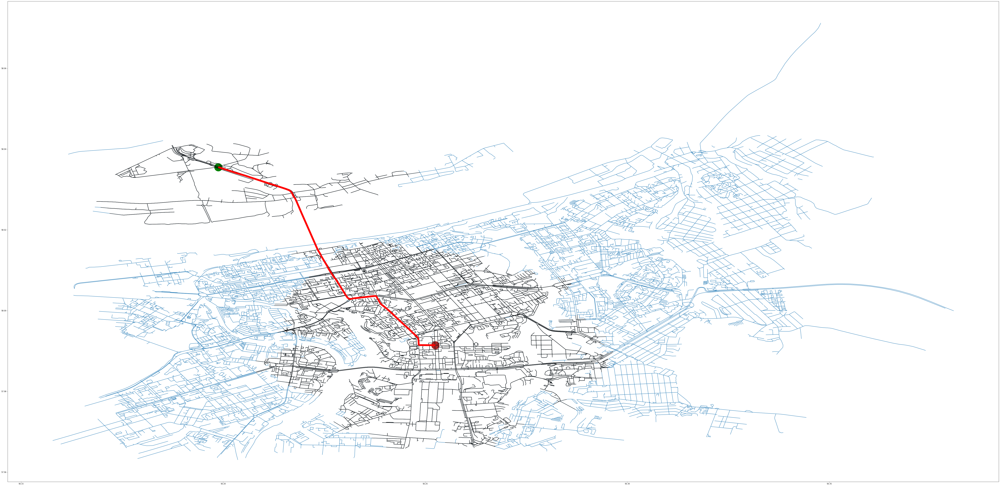

In [359]:
base = gdf.plot(figsize=(100,100))
checked = gdf_checked.plot(ax=base, color='black')
fig = gdf_shortest_path.plot(ax = checked, color='red', linewidth=10)
fig = gdf_st.plot(ax = fig, color='brown', markersize=2000)
fig = gdf_end.plot(ax = fig, color='green', markersize=2000)
fig.plot();

In [360]:
fig.get_figure().savefig('res_img/biderectional_dijkstra/'+shp_directory+'.png')

In [361]:
ans = []
checked = []
with open('graphs/output_astar.txt', 'r') as f:
    ans_size = f.readline()
    for i in range(int(ans_size)-1):
        edge = tuple(map(int, f.readline().split()))
        ans.append(edge)
    checked_size = f.readline()
    for i in range(int(checked_size)-1):
        edge = tuple(map(int, f.readline().split()))
        checked.append(edge)


In [362]:
crs = {'init':'epsg:4326'}

geometry_shortest_path = [etols[xy] for xy in ans]
gdf_shortest_path = gpd.GeoDataFrame(geometry = geometry_shortest_path)

geometry_checked = [etols[xy] for xy in checked]
gdf_checked = gpd.GeoDataFrame(geometry = geometry_checked)

In [363]:
len(geometry_shortest_path), len(geometry_checked)

(118, 9773)

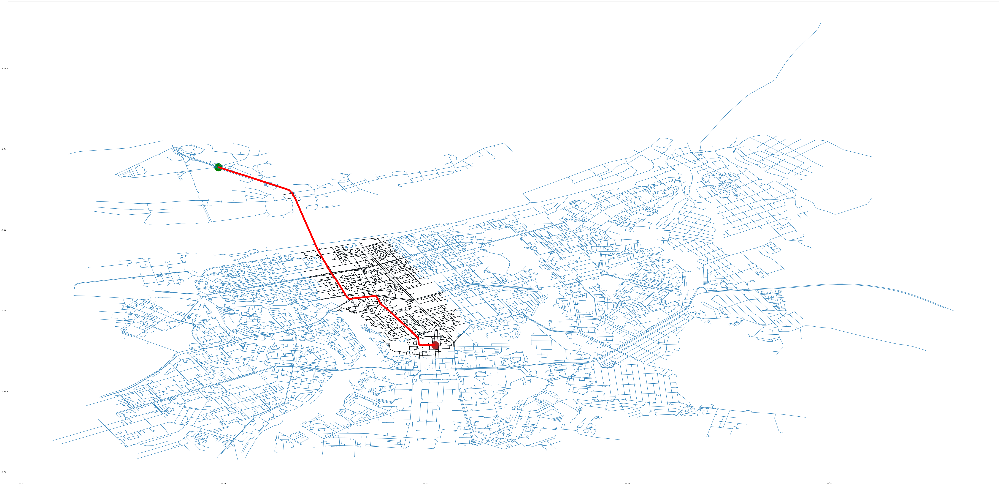

In [364]:
base = gdf.plot(figsize=(100,100))
checked = gdf_checked.plot(ax=base, color='black')
fig = gdf_shortest_path.plot(ax = checked, color='red', linewidth=10)
fig = gdf_st.plot(ax = fig, color='brown', markersize=2000)
fig = gdf_end.plot(ax = fig, color='green', markersize=2000)
fig.plot();

In [365]:
fig.get_figure().savefig('res_img/astar/'+shp_directory+'.png')